# TRABAJO FINAL - DATA VIZ

## PARTE 2 - TEXT ANALYSIS

* Escobar, Aldo
* Alvarez Muñoz, Carolina

In [1]:
import pandas as pd
from nltk.corpus import stopwords
import unidecode
from wordcloud import WordCloud
import matplotlib.pyplot as plt
%matplotlib inline
#from stop_words import get_stop_words
import numpy as np
import re
from PIL import Image
from wordcloud import ImageColorGenerator
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.manifold import TSNE
import gensim
from gensim.models import Word2Vec
from yellowbrick.text import TSNEVisualizer
from html5lib.sanitizer import HTMLSanitizerMixin
from nltk import word_tokenize
import string
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
import pyLDAvis
import pyLDAvis.sklearn
from sklearn.decomposition import LatentDirichletAllocation
pyLDAvis.enable_notebook()
import math
import random
import warnings
warnings.filterwarnings('ignore')

stop_words = stopwords.words('english')
tags_html = HTMLSanitizerMixin.acceptable_elements

c:\programdata\anaconda3\lib\site-packages\gensim\utils.py:1209: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


# Funciones para limpieza de texto
Se crearon funciones para la limpieza de código HTML que había adentro de los textos. Ademas otra para normalizar (sacar caracteres especiales, etc)

In [2]:
def cleanhtml(raw_html):
  cleanr = re.compile('<.*?>')
  cleantext = re.sub(cleanr, '', raw_html)
  cleantext = cleantext.replace('\n', ' ')
  return cleantext

In [3]:
def normalize(string):
    return re.sub("[^0-9a-zA-Z]+", " ", string.lower())

# Funcion para generar una DF que contiene el conteo palabras más frecuentes. 
La misma está ordenada de manera descendiente. Se la define para luego generar un gráfico de barras

In [4]:
def generateDFCounts(words_series):
    words=[]
    for w in list(words_series):
                w=w.lower()
                w = unidecode.unidecode(w)
                words.append(" ".join([word for word in w.split() if word not in stop_words and word not in tags_html+["href", "ilink", "class", "amp"]])) 
    vec = CountVectorizer(stop_words=stop_words).fit(words)
    bag_of_words = vec.transform(words)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    words=dict(words_freq)
    df_words = pd.DataFrame(
        {'word': list(words.keys()),
         'word_count': list(words.values())
        })
    return df_words

# Funcion para crear TSNE model y plotearlo

In [5]:
def tsne_plot(model):
    "Creates and TSNE model and plots it"
    labels = []
    tokens = []

    for word in model.wv.vocab:
        tokens.append(model[word])
        labels.append(word)
    
    tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(16, 16));
    for i in range(len(x)):
        plt.scatter(x[i],y[i]);
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom');
    plt.show();

# Funcion generadora de paleta de colores y de wordclouds

In [6]:
max_font_size = 300
random.seed(2019)

def blue_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "rgb(0, 0, %s)" % math.floor(font_size/max_font_size * 255)

def red_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "hsl(10, 100%%, %d%%)" % random.randint(40, 100)

In [7]:
def generateWordCloud(data, color):

    texts=' '.join(data)
    texts=unidecode.unidecode(texts)

    for word in removeWords:
        texts = re.sub(r'\b' + word + r'\b', '',texts)

    wordcloud_essay = WordCloud(stopwords=stop_words, width=1880, height=260, background_color="white",repeat=False, collocations=False, max_words=100).generate(texts)
    plt.figure(figsize=[30,30])
    if color == None:
        plt.imshow(wordcloud_essay.recolor(color), interpolation="bilinear")
    else:
        plt.imshow(wordcloud_essay.recolor(color_func=color, random_state=2019), interpolation="bilinear")
    plt.axis("off")

# Essays
The essay prompts corresponding to the columns 'Essay 0...9' are

* essay0: My self summary
* essay1: What I’m doing with my life
* essay2: I’m really good at
* essay3: The first thing people usually notice about me
* essay4: Favorite books, movies, show, music, and food
* essay5: The six things I could never do without
* essay6: I spend a lot of time thinking about
* essay7: On a typical Friday night I am
* essay8: The most private thing I am willing to admit
*  essay9: You should message me if...

In [8]:
df_essay=pd.read_csv("profiles.csv", usecols=["essay0", "essay1","essay2", "essay3","essay4", "essay5","essay6", "essay7","essay8", "essay9", "sex"])
df_essay=df_essay.fillna(({'essay0':'','essay1':'','essay2':'','essay3':'','essay4':'','essay5':'',
               'essay6':'','essay7':'','essay8':'','essay9':'',}))

for i in range(10):
    df_essay["essay"+str(i)] = df_essay["essay"+str(i)].apply(cleanhtml)
    df_essay["essay"+str(i)] = df_essay["essay"+str(i)].apply(normalize)

df_essay_m = df_essay[df_essay["sex"]=="m"]
df_essay_f = df_essay[df_essay["sex"]=="f"]
df_essay.head()

,essay0,essay1,essay2,essay3,essay4,essay5,essay6,essay7,essay8,essay9,sex
0,about me i would love to think that i was some...,currently working as an international agent fo...,making people laugh ranting about a good salti...,the way i look i am a six foot half asian half...,books absurdistan the republic of mice and men...,food water cell phone shelter,duality and humorous things,trying to find someone to hang out with i am d...,i am new to california and looking for someone...,you want to be swept off your feet you are tir...,m
1,i am a chef this is what that means 1 i am a w...,dedicating everyday to being an unbelievable b...,being silly having ridiculous amonts of fun wh...,,i am die hard christopher moore fan i don t re...,delicious porkness in all of its glories my bi...,,,i am very open and will share just about anyth...,,m
2,i m not ashamed of much but writing public tex...,i make nerdy software for musicians artists an...,improvising in different contexts alternating ...,my large jaw and large glasses are the physica...,okay this is where the cultural matrix gets so...,movement conversation creation contemplation t...,,viewing listening dancing talking drinking per...,when i was five years old i was known as the b...,you are bright open intense silly ironic criti...,m
3,i work in a library and go to school,reading things written by old dead people,playing synthesizers and organizing books acco...,socially awkward but i do my best,bataille celine beckett lynch jarmusch r w fas...,,cats and german philosophy,,,you feel so inclined,m
4,hey how s it going currently vague on the prof...,work work work work play,creating imagery to look at http bagsbrown blo...,i smile a lot and my inquisitive nature,music bands rappers musicians at the moment th...,,,,,,m


# Playing with essay5 - The six things I could never do without
Ploteo de barras de palabras más frecuentes escritos en general (hombres y mujeres), escritos por hombres y por mujeres.

In [9]:
df_words = generateDFCounts(df_essay.essay5)
df_words_m = generateDFCounts(df_essay_m.essay5)
df_words_f = generateDFCounts(df_essay_f.essay5)


In [10]:
data  = [go.Bar(
              y = df_words.head(20).word[::-1],
              x = df_words.head(20).word_count[::-1],
              orientation='h')]
layout = go.Layout(
        title = "Top 20 Most Frequent Words")

fig  = go.Figure(data=data, layout=layout)
iplot(fig)

In [11]:
data  = [go.Bar(
              y = df_words_m.head(20).word[::-1],
              x = df_words_m.head(20).word_count[::-1],
              orientation='h')]
layout = go.Layout(
        title = "Top 20 Most Frequent Words - Male")

fig  = go.Figure(data=data, layout=layout)
iplot(fig)

In [12]:
data  = [go.Bar(
              y = df_words_f.head(20).word[::-1],
              x = df_words_f.head(20).word_count[::-1],
              orientation='h')]
layout = go.Layout(
        title = "Top 20 Most Frequent Words - Female")

fig  = go.Figure(data=data, layout=layout)
iplot(fig)

In [13]:
removeWords=[]
removeWords.append("br")
removeWords.append("ilink")
removeWords.append("href")
removeWords.append("ve")
removeWords.append("don")
removeWords.append("ll")
removeWords.append("amp")

# WORDCLOUDS GENERAL - WORDCLOUDS MALE - WORDCLOUDS FEMALE

## WORD CLOUD #0 -  My self summary

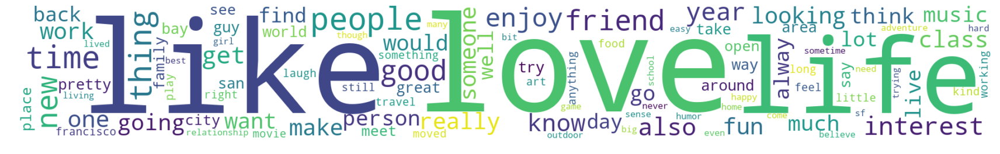

In [14]:
generateWordCloud(df_essay["essay0"], None)

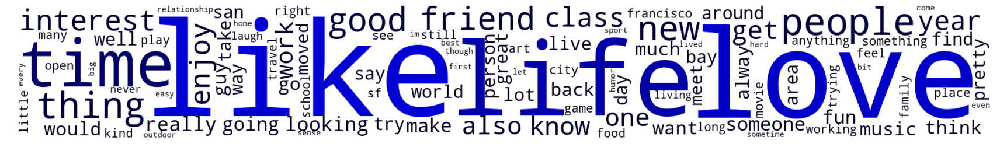

In [15]:
generateWordCloud(df_essay_m["essay0"], blue_color_func)

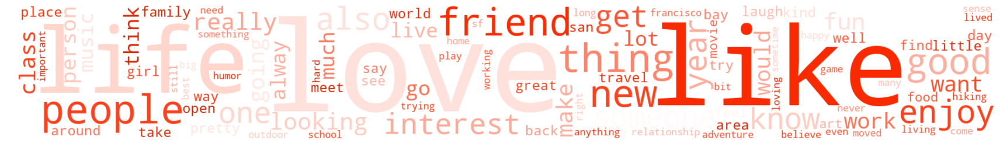

In [16]:
generateWordCloud(df_essay_f["essay0"], red_color_func)

## WORD CLOUD #1 - What I’m doing with my life

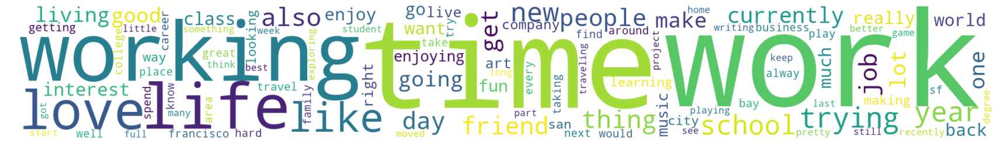

In [17]:
generateWordCloud(df_essay["essay1"], None)

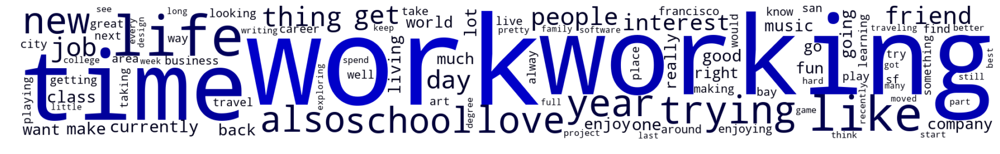

In [18]:
generateWordCloud(df_essay_m["essay1"], blue_color_func)

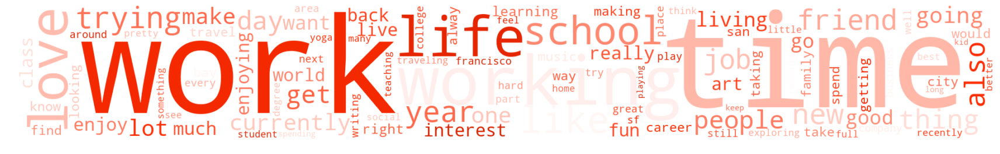

In [19]:
generateWordCloud(df_essay_f["essay1"], red_color_func)

## WORD CLOUD #2 -  I’m really good at

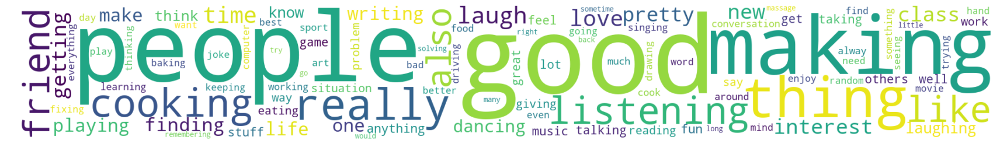

In [20]:
generateWordCloud(df_essay["essay2"], None)

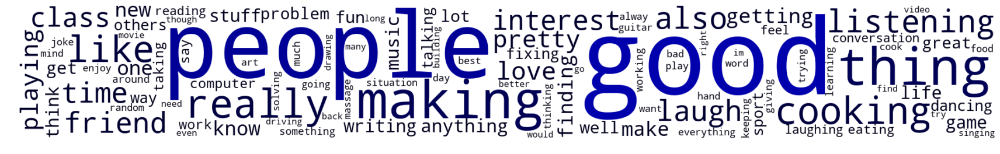

In [21]:
generateWordCloud(df_essay_m["essay2"], blue_color_func)

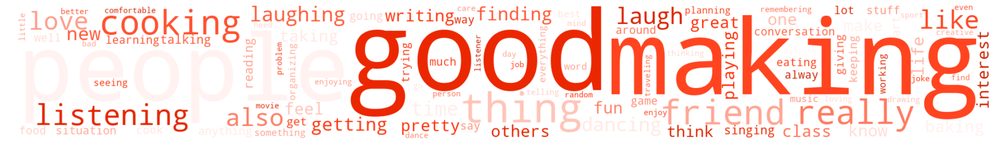

In [22]:
generateWordCloud(df_essay_f["essay2"], red_color_func)

## WORD CLOUD #3 - The first thing people usually notice about me

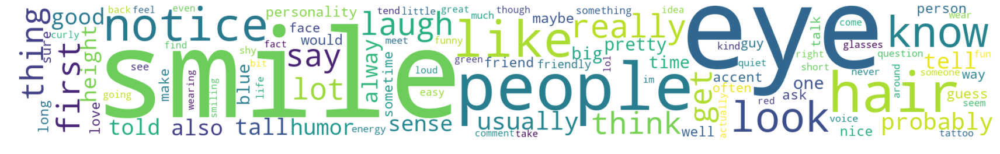

In [23]:
generateWordCloud(df_essay["essay3"], None)

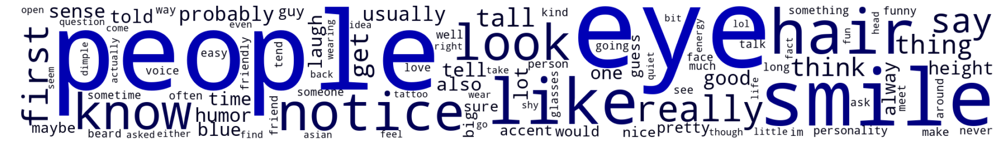

In [24]:
generateWordCloud(df_essay_m["essay3"], blue_color_func)

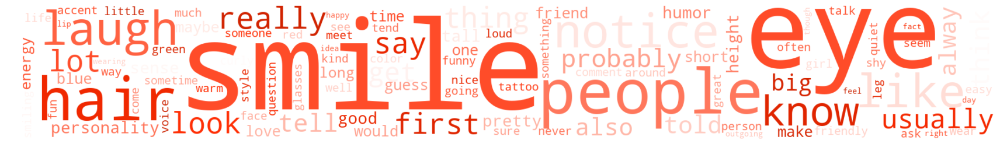

In [25]:
generateWordCloud(df_essay_f["essay3"], red_color_func)

## WORD CLOUD #4 - Favorite books, movies, show, music, and food

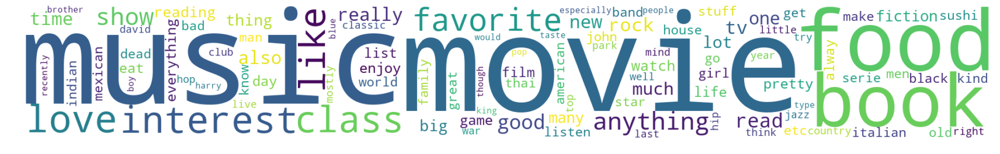

In [26]:
generateWordCloud(df_essay["essay4"], None)

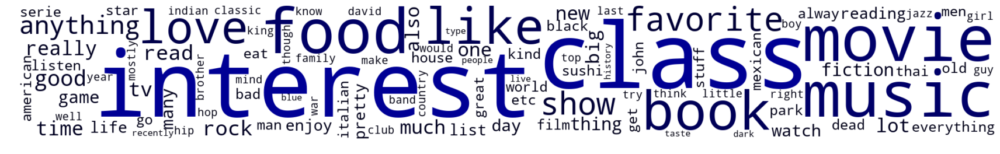

In [27]:
generateWordCloud(df_essay_m["essay4"], blue_color_func)

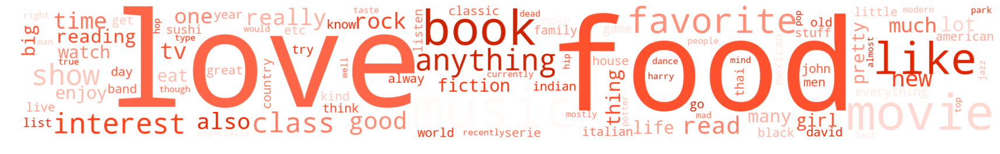

In [28]:
generateWordCloud(df_essay_f["essay4"], red_color_func)

## WORD CLOUD #5 - The six things I could never do without

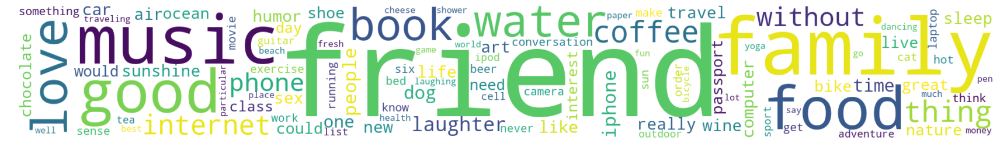

In [29]:
generateWordCloud(df_essay["essay5"], None)

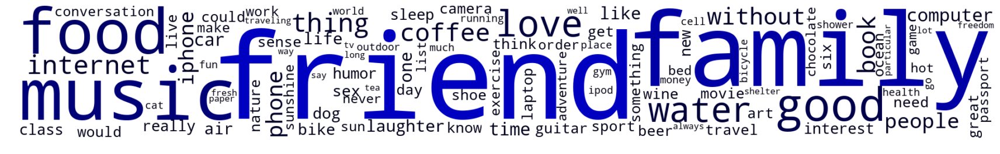

In [30]:
generateWordCloud(df_essay_m["essay5"], blue_color_func)

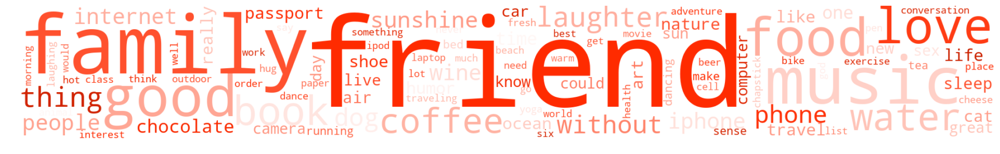

In [31]:
generateWordCloud(df_essay_f["essay5"], red_color_func)

## WORD CLOUD #6 -  I spend a lot of time thinking about

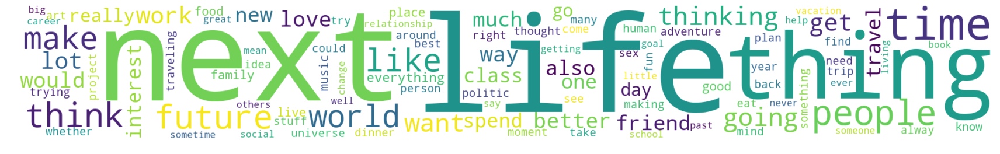

In [32]:
generateWordCloud(df_essay["essay6"], None)

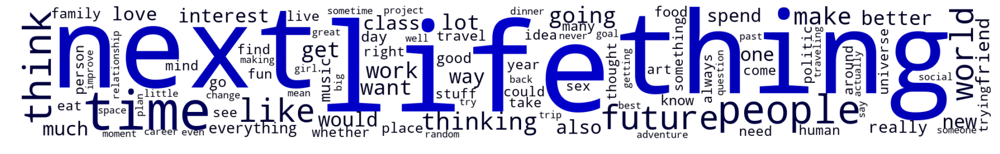

In [33]:
generateWordCloud(df_essay_m["essay6"], blue_color_func)

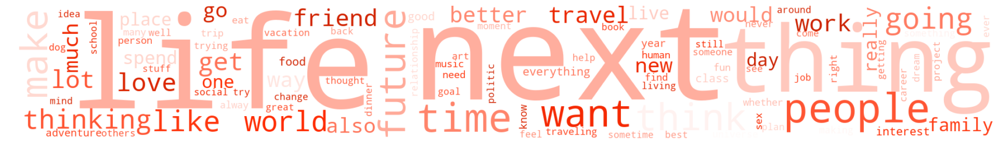

In [34]:
generateWordCloud(df_essay_f["essay6"], red_color_func)

## WORD CLOUD #7 -  On a typical Friday night I am

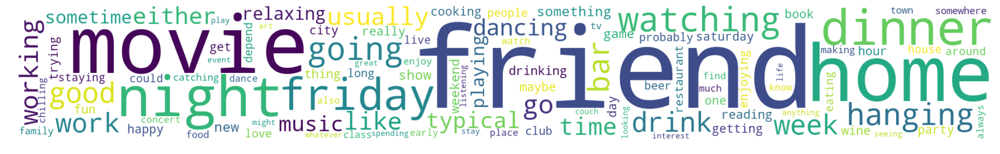

In [35]:
generateWordCloud(df_essay["essay7"], None)

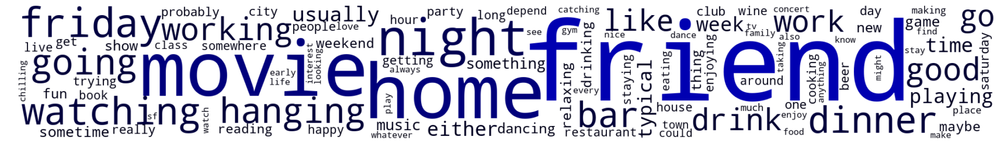

In [36]:
generateWordCloud(df_essay_m["essay7"], blue_color_func)

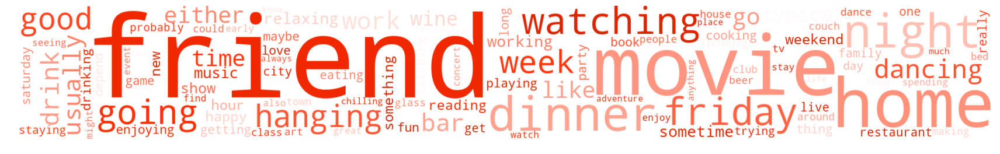

In [37]:
generateWordCloud(df_essay_f["essay7"], red_color_func)

## WORD CLOUD #8 -  The most private thing I am willing to admit

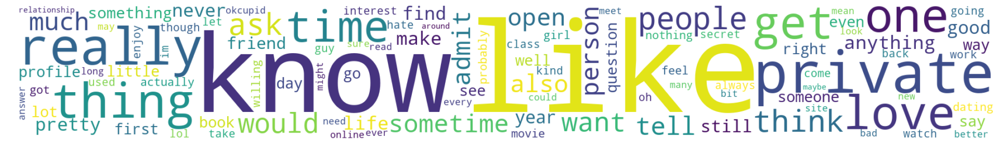

In [38]:
generateWordCloud(df_essay["essay8"], None)

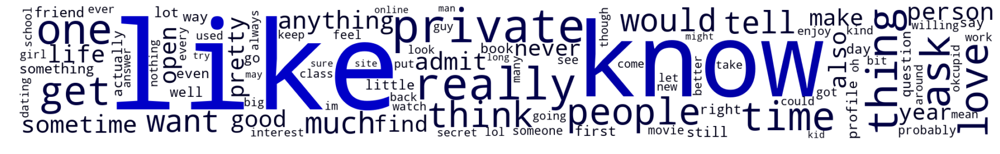

In [39]:
generateWordCloud(df_essay_m["essay8"], blue_color_func)

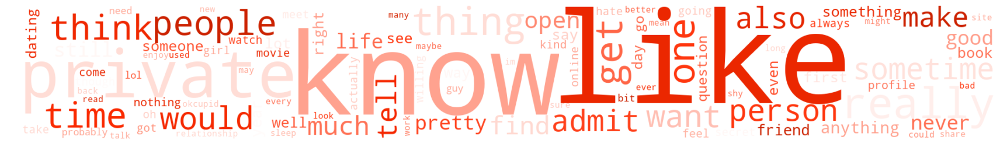

In [40]:
generateWordCloud(df_essay_f["essay8"], red_color_func)

## WORD CLOUD #9 - You should message me if...

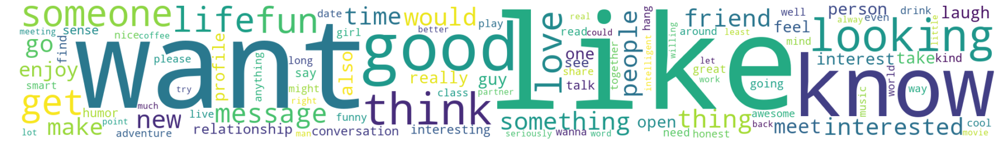

In [41]:
generateWordCloud(df_essay["essay9"], None)

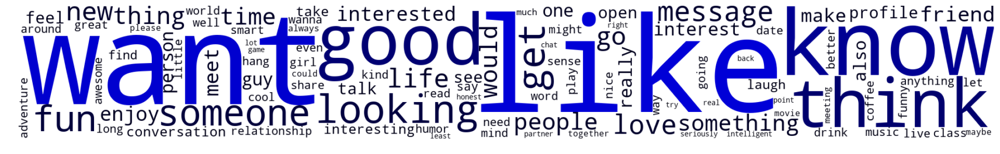

In [42]:
generateWordCloud(df_essay_m["essay9"], blue_color_func)

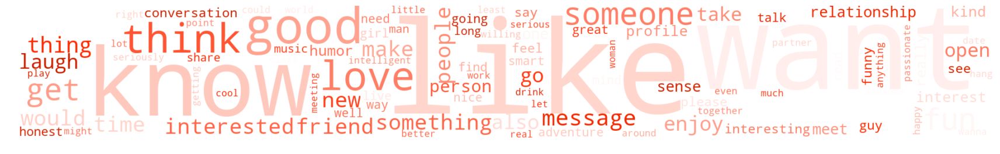

In [43]:
generateWordCloud(df_essay_f["essay9"], red_color_func)

# WORD2VEC MODEL & TSNE PLOT

Armo un modelo word2vec con todas las respuestas. Consulto para algunas palabras cuales son sus palabras "mas cercanas".
Armo el corpus

In [44]:
tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix = tfidf_vectorizer.fit_transform(list(df_essay["essay0"])+list(df_essay["essay1"])+list(df_essay["essay2"])+
                                             list(df_essay["essay3"])+list(df_essay["essay4"])+list(df_essay["essay5"])+
                                             list(df_essay["essay6"])+list(df_essay["essay7"])+list(df_essay["essay8"])+
                                             list(df_essay["essay9"]))

model = Word2Vec([i.split() for i in list(df_essay["essay0"])]+[i.split() for i in list(df_essay["essay1"])]
                 +[i.split() for i in list(df_essay["essay2"])]+[i.split() for i in list(df_essay["essay3"])]
                 +[i.split() for i in list(df_essay["essay4"])]+[i.split() for i in list(df_essay["essay5"])]
                 +[i.split() for i in list(df_essay["essay6"])]+[i.split() for i in list(df_essay["essay7"])]
                 +[i.split() for i in list(df_essay["essay8"])] +[i.split() for i in list(df_essay["essay9"])])


print(tfidf_matrix.shape)

(599460, 153466)


In [45]:
# We will also need to get the words closest to a word
model.similar_by_word('movie')

[('flick', 0.7605224251747131),
 ('movies', 0.7100597620010376),
 ('film', 0.6358373761177063),
 ('tv', 0.5656596422195435),
 ('films', 0.5567483305931091),
 ('comedy', 0.5334653854370117),
 ('dvd', 0.5294792056083679),
 ('documentary', 0.5210131406784058),
 ('show', 0.5200695991516113),
 ('netflix', 0.517603874206543)]

In [46]:
model.similar_by_word('beer')

[('whiskey', 0.8105881214141846),
 ('bourbon', 0.7937544584274292),
 ('beers', 0.7823565006256104),
 ('tequila', 0.753606915473938),
 ('scotch', 0.7484286427497864),
 ('brew', 0.7440779209136963),
 ('whisky', 0.7306842803955078),
 ('cocktail', 0.7295022010803223),
 ('cocktails', 0.7121560573577881),
 ('drink', 0.7106276750564575)]

In [47]:
model.similar_by_word('nerd')

[('geek', 0.9218378067016602),
 ('dork', 0.8837274312973022),
 ('goofball', 0.7208352088928223),
 ('gamer', 0.7145663499832153),
 ('nerdy', 0.6674609184265137),
 ('jock', 0.6435470581054688),
 ('bookworm', 0.6410239934921265),
 ('workaholic', 0.6266615986824036),
 ('loner', 0.621737003326416),
 ('foodie', 0.6162344217300415)]

In [48]:
model.similar_by_word('travel')

[('traveling', 0.7882212400436401),
 ('travelling', 0.7140992879867554),
 ('explore', 0.6785411238670349),
 ('visit', 0.6049590110778809),
 ('vacations', 0.5774855613708496),
 ('go', 0.5448375940322876),
 ('trips', 0.5113905668258667),
 ('internationally', 0.50146484375),
 ('cook', 0.4966351389884949),
 ('socialize', 0.4929097294807434)]

In [49]:
def build_corpus(data):
    "Creates a list of lists containing words from each sentence"
    corpus = []
    for col in ["essay0"]:
    #for col in ["essay0", "essay1","essay2", "essay3","essay4", "essay5","essay6", "essay7","essay8", "essay9"]:
        for sentence in data[col].iteritems():
            word_list = sentence[1].split(" ")
            corpus.append(word_list)
            
    return corpus

corpus = build_corpus(df_essay)

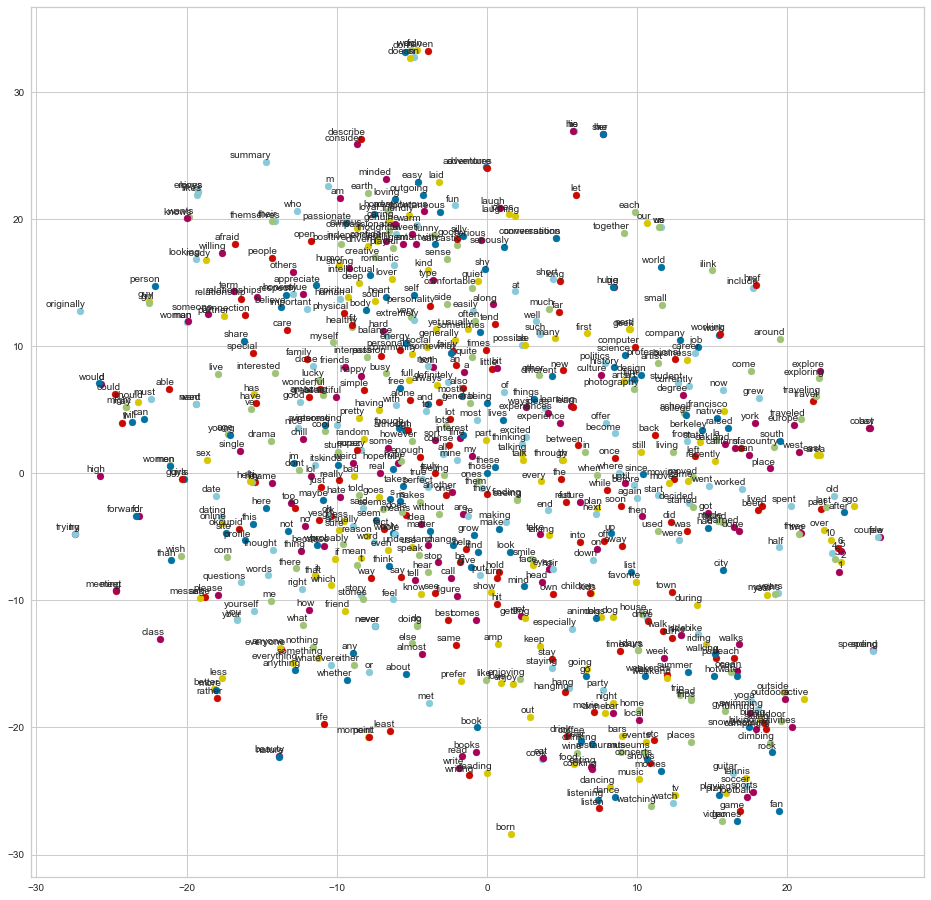

In [50]:
minimodel = Word2Vec(corpus, size=100, window=20, min_count=1000, workers=4)
tsne_plot(minimodel);

# Visualización interactiva de modelos de detección de tópicos


In [51]:
list_essay = list(df_essay.sample(n=40000)["essay0"])

tf_vectorizer = CountVectorizer(stop_words = stop_words+["href", "ilink", "class", "amp", "nbsp"],
                                token_pattern = r'\b[a-zA-Z]{3,}\b')
dtm_tf = tf_vectorizer.fit_transform(list_essay)
tfidf_vectorizer = TfidfVectorizer(**tf_vectorizer.get_params())
dtm_tfidf = tfidf_vectorizer.fit_transform(list_essay)

# for TF DTM
lda_tf = LatentDirichletAllocation(n_topics=8, random_state=2019)
lda_tf.fit(dtm_tf)

LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
             evaluate_every=-1, learning_decay=0.7,
             learning_method='batch', learning_offset=10.0,
             max_doc_update_iter=100, max_iter=10, mean_change_tol=0.001,
             n_components=10, n_jobs=None, n_topics=8, perp_tol=0.1,
             random_state=2019, topic_word_prior=None,
             total_samples=1000000.0, verbose=0)

In [52]:
pyLDAvis.sklearn.prepare(lda_tf, dtm_tf, tf_vectorizer)

PreparedData(topic_coordinates=            Freq  cluster  topics         x         y
topic                                                
6      23.150788        1       1 -0.041143  0.025179
4      20.734320        1       2 -0.086801  0.040662
5      20.000174        1       3 -0.146762 -0.052199
1      14.279964        1       4 -0.166344 -0.058918
2      14.252620        1       5 -0.017865 -0.051860
7       3.016094        1       6  0.126676  0.167958
0       2.479898        1       7  0.047049  0.062574
3       2.086142        1       8  0.285190 -0.133395, topic_info=      Category          Freq         Term         Total  loglift  logprob
term                                                                     
24293  Default  10532.000000    interests  10532.000000  30.0000  30.0000
27193  Default  18945.000000         life  18945.000000  29.0000  29.0000
40990  Default   5448.000000          san   5448.000000  28.0000  28.0000
3979   Default   5934.000000          bay   5934.000000  27.0000  27.0000
18355  Default   4480.000000    francisco   4480.000000  26.0000  26.0000
30969  Default   4692.000000        moved   4692.000000  25.0000  25.0000
27270  Default  29109.000000         like  29109.000000  24.0000  24.0000
31950  Default  14817.000000          new  14817.000000  23.0000  23.0000
33128  Default   9156.000000          one   9156.000000  22.0000  22.0000
27921  Default  31328.000000         love  31328.000000  21.0000  21.0000
2388   Default   5123.000000         area   5123.000000  20.0000  20.0000
53157  Default   7444.000000        years   7444.000000  19.0000  19.0000
44046  Default   9265.000000      someone   9265.000000  18.0000  18.0000
15258  Default  11252.000000        enjoy  11252.000000  17.0000  17.0000
20029  Default  14117.000000         good  14117.000000  16.0000  16.0000
27775  Default   9465.000000      looking   9465.000000  15.0000  15.0000
8434   Default   5047.000000         city   5047.000000  14.0000  14.0000
18554  Default  11980.000000      friends  11980.000000  13.0000  13.0000
18791  Default   9023.000000          fun   9023.000000  12.0000  12.0000
41913  Default   2934.000000         self   2934.000000  11.0000  11.0000
5501   Default   2561.000000         born   2561.000000  10.0000  10.0000
31242  Default   7631.000000        music   7631.000000   9.0000   9.0000
19097  Default   2467.000000        games   2467.000000   8.0000   8.0000
20821  Default   4764.000000          guy   4764.000000   7.0000   7.0000
16778  Default   5345.000000       family   5345.000000   6.0000   6.0000
27520  Default   3207.000000        lived   3207.000000   5.0000   5.0000
26146  Default   9723.000000         know   9723.000000   4.0000   4.0000
35018  Default   7304.000000       person   7304.000000   3.0000   3.0000
37127  Default   2209.000000      profile   2209.000000   2.0000   2.0000
52803  Default   5580.000000        world   5580.000000   1.0000   1.0000
...        ...           ...          ...           ...      ...      ...
2885    Topic8     48.217063      atheist    119.655114   2.9610  -6.8378
1856    Topic8     58.481161        anime    161.361491   2.8549  -6.6449
23009   Topic8     61.676779     identify    186.039816   2.7658  -6.5917
9503    Topic8    138.693548     computer    694.523591   2.2589  -5.7813
19295   Topic8    150.962005         geek    801.023178   2.2010  -5.6965
35888   Topic8     62.060436        plink    209.148920   2.6549  -6.5855
439     Topic8     31.836432     activism     68.394215   3.1052  -7.2529
51038   Topic8    145.200345        video   1029.719614   1.9109  -5.7354
19312   Topic8     81.567600        geeky    372.780307   2.3503  -6.3121
40261   Topic8    166.781691         rock   1537.725870   1.6485  -5.5969
43946   Topic8     77.237266     software    371.703479   2.2986  -6.3667
38114   Topic8     43.616196      radical    125.268540   2.8148  -6.9381
41473   Topic8    121.222276      science    988.755996   1.7710  -5.9159
19097   Topic